In [1]:
%matplotlib inline

In [2]:
%config InlineBackend.figure_format = "retina"

from matplotlib import rcParams
rcParams["savefig.dpi"] = 300
rcParams["figure.dpi"] = 300
rcParams["font.size"] = 12

# Calibration of simple SEIRD model

Calibration of simple SEIRD model, for testing an analysis idea of the COVID modelling group. Calibration is done for 3 parameters: 2 rates (beta and gamma) and a scale factor for the error variance. The analysis is done using the emcee package, which performs MCMC in Python.

In [3]:
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt

## Model description

The example model of this notebook is a simple SEIRD epidemic model, with state variables
- $S$ : number of suseptible individuals,
- $E$  : number of exposed individuals,
- $I$  : number of infected individuals,
- $R$  : number of resistant individuals,
- $D$ : number of dead individuals (due to disease),

that are coupled through a system of ODE's:
$$
\begin{eqnarray}
\dot{S} &=& - \beta \cdot S \cdot I,\\
\dot{E} &=&  \beta \cdot S \cdot I - \gamma \cdot E,\\
\dot{I} &=&  \gamma \cdot E  - \omega \cdot I - \delta \cdot I,\\
\dot{R} &=&  \omega \cdot I,\\
\dot{D} &=&  \delta \cdot I.\\
\end{eqnarray}
$$

The goal is to infer the parameters $\beta$ and $\gamma$ from synthetic data of $I$ and $D$.

Since the data are generated by counting the number of $I$ and $D$ at specific days, we can model this with a **Poisson Distribution**.
The full statistical model of the observed states $X = [I,D]$ is thus:
$$
X(t) \sim P(X(t) = x) = \frac{y(t)^x\,e^{-y(t)}}{x!},
$$
with $y(t)$ the result of the system of ODE's at time t.

### System of ODE's

In [10]:
def dy_dt(y, t, params):
    """
    (Autonomous) system of differential equations of the SEIRD compartment model.

    Parameters
    ----------
    y : list
        vector of state variables:
            - s : number of suseptible individuals times 1e-6
            - e : number of exposed individuals
            - i : number of infected individuals
            - r : number of resistant individuals
            - d : number of dead individuals (due to disease)
    t : float
        current time step (not used in this system)
    params : list
        parameter vector (to be calibrated):
            - BETA : transmission probability given a contact between susceptible and infectious
            - GAMMA : transition rate from compartment of infected to the compartment of infectious
            - OMEGA : recovering rate
            - DELTA : death rate due to disease  

    Returns
    -------
    derivs : list
        derivatives.
    """
    s,e,i,r,d = y                              # unpack state variables                                 # unpack current values of y
    BETA, GAMMA, OMEGA, DELTA  = params        # unpack parameters
    derivs = [-BETA*s*i, 
              BETA*s*i-GAMMA*e, 
              GAMMA*e -OMEGA*i -DELTA*i,  
              OMEGA*i, 
              DELTA*i]
    return derivs

## Simulated data

To try out the data analysis procedure, we'll test it on some synthetic data.

##### Solve ODE's

In [13]:
# Initial values
s_0 = 1.1e3        # initial susceptible population 
e_0 = 20.0         # initial exposed population
i_0 = 2.0          # initial infectious population
r_0 = 0.0          # initial recovered population            
d_0 = 0.0          # initial dead population   

y_0 = [s_0, e_0, i_0, r_0, d_0] # Bundle initial conditions for ODE solver

# Make time array for solution (measured in days)
tStop = 30.
tInc =  1.
t_vec = np.arange(0., tStop, tInc)


# True parameters
#----------------
BETA_true  = 0.05
GAMMA_true = 0.25

params = np.array([BETA_true, GAMMA_true ,0.10, 0.030])

# ODE results
#----------------
y = odeint(dy_dt, y_0, t_vec, args=(params,))

##### Add uncertainty

In [15]:
np.random.seed(42)
y_ID = y[1:,[2,4]] #exclude initial values
obs_ID = np.random.poisson(y_ID)

Plot synthetic data.

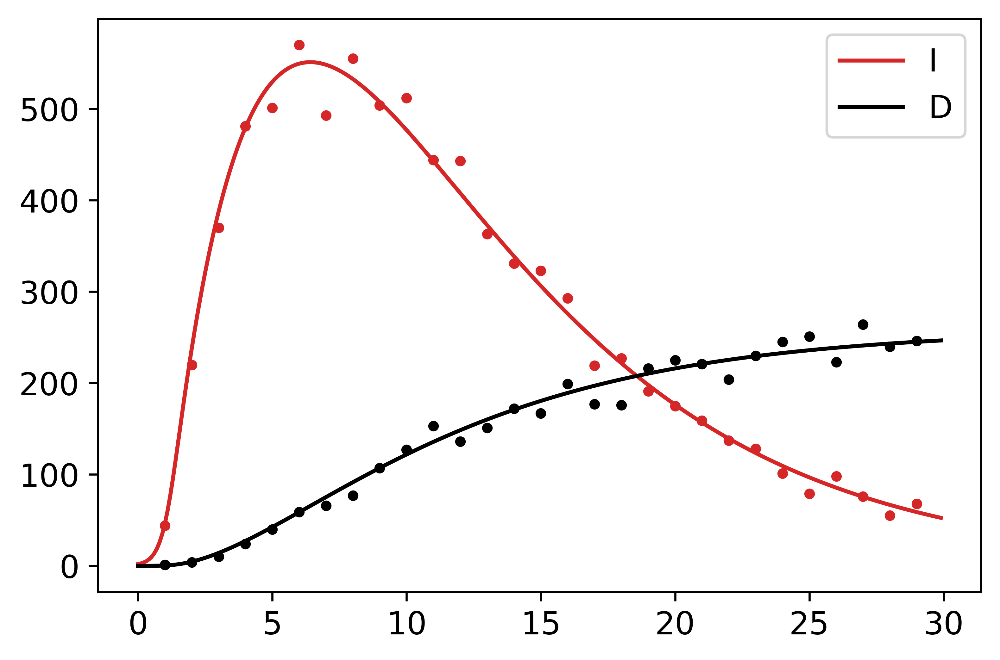

In [16]:
labels = ["I","D"]
col = ["tab:red", "black"]
t_vec_smooth = np.arange(0., tStop, tInc/10)
y_smooth = odeint(dy_dt, y_0, t_vec_smooth, args=(params,))
y_ID_smooth = y_smooth[:,(2,4)]
for i in range(len(labels)):
    plt.plot(t_vec_smooth,y_ID_smooth[:,i],label = labels[i], c = col[i])
    plt.plot(t_vec[1:],obs_ID[:,i], ".", c = col[i])
plt.legend();

Plot residuals.

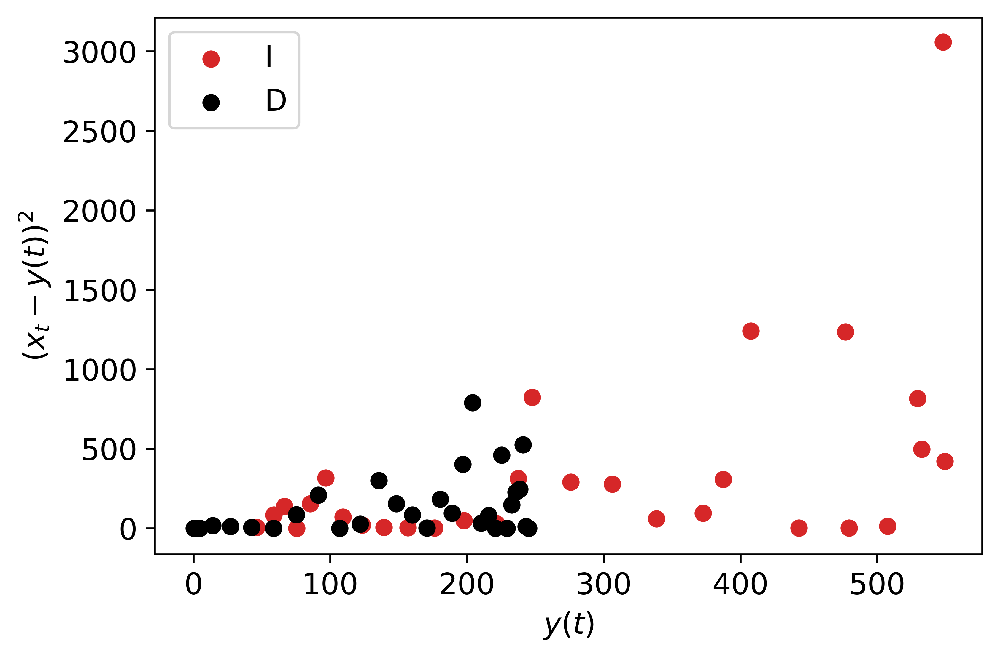

In [17]:
residuals = obs_ID - y_ID

labels = ["I","D"]
col = ["tab:red", "black"]
for i in range(len(labels)):
    plt.scatter(y_ID[:,i],residuals[:,i]**2,label = labels[i], c = col[i])
plt.ylabel("$(x_t - y(t))^2$")
plt.xlabel("$y(t)$")
plt.legend();

## MLE

The **loglikelihood** of a $n$ observations $\{x_1, ..., x_n\}$ associated with a **Poisson distribution** with mean $\lambda$, i.e. the log of the likelikhood that $\lambda$ is the true average given the data, is

$$
\ln( P(\lambda | x_1, ..., x_n) ) = -n\lambda - \sum_{i=1}^n \ln(x_j!) + \ln(\lambda) \sum_{i=1}^n x_j
$$

See [this link](https://www.statlect.com/fundamentals-of-statistics/Poisson-distribution-maximum-likelihood) for the proof.
Note that maximising this for a value of $y$ is independent of the middle term on the rhs, so we keep it out in the rest of the discussion.

For $n = 1$ this reduces to

$$
\ln( P(\lambda | x) ) = -\lambda + \ln(\lambda) x.
$$

Given a different set of $m$ datapoints $\{x(t_1), ..., x(t_m)\}$. We want to know the likelihood that any of these data points $x(t_j)$ are the outcome of a Poisson experiment with mean $\lambda_j$. As a boundary condition, we demand that all these $\lambda_j$ fall the curve described by $y(t)$, i.e. $\lambda_j = y(t_j)$. The (relevant part of the) loglikehood then becomes

$$
\ln( P(\lambda_1, ..., \lambda_m) | x_1, ... x_m) ) = \ln( P(y(t) | x_1, ..., x_m) ) = -\sum_{j=1}^m y(t_j) - \sum_{j=1}^m y(t_j) x(t_j)
$$

The values $\lambda_j$ are determined by the curve $y(t)$, which in turn depends on a number of parameters summarised in the vector $\boldsymbol{\theta}$. Finding the best fit through the data is therefore a matter of finding the maximal value

$$
-\sum_{j=1}^m y(t_j; \boldsymbol{\hat{\theta}}) - \sum_{j=1}^m y(t_j; \boldsymbol{\hat{\theta}}) x(t_j)
$$

with $\boldsymbol{\hat{\theta}}$ the set of best-fit parameters. For our SEIRD model this set is $\{\hat{\beta}, \hat{\gamma}, \hat{\omega}, \hat{\delta}\}$, but we will typically fix some of these, informed by data.

In [19]:
# define prior and likelihood
def log_prior(theta):
    if np.any(theta < 0):
        return -np.inf
    return 0.0

def log_likelihood(theta, t_vec, obs_ID):
    beta, gamma = theta
    params = np.array([beta, gamma ,0.10, 0.030])
    y = odeint(dy_dt, y_0, t_vec, args=(params,))
    y_ID = y[1:,[2,4]] #exclude initial values
    return -np.sum(y_ID) + np.sum(obs_ID * np.log(y_ID)) # this is a constant, so it can be excluded: - np.sum(np.log(np.math.factorial(obs_ID)))

def log_probability(theta, t_vec, obs_ID):
    lp = log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf
    ll = log_likelihood(theta, t_vec, obs_ID)
    log_prob = lp + ll
    if np.isnan(log_prob):
        print("log prob = nan")
        print(f"theta : {theta}\nlp    :{lp}\nll    :{ll}")
    return log_prob

In [29]:
from scipy.optimize import minimize
np.random.seed(1654) #used different seed here, because at 42, it got stuck in a local minimum...
nll = lambda *args: -log_likelihood(*args) # negative log likelihood
true_params = np.array([BETA_true, GAMMA_true])
print("True parameters:")
print("\tβ = {0:.7f}".format(BETA_true))
print("\t𝛾 = {0:.3f}".format(GAMMA_true))


initial = np.random.rand(2)
soln = minimize(nll, initial, args=(t_vec, obs_ID), bounds = [(0,None),(0,None)])
print(f"-------------------------------------------------" ) 
print(f"minimization stopped after {soln.nfev} iterations." ) 
if not soln.success:
    print("unsuccesfull, see message:")
    print(soln.message)
BETA_ml, GAMMA_ml = soln.x

print(f"Maximum likelihood value : {soln.fun}")
print("Maximum likelihood estimates:")
print("\tβ = {0:.7f}".format(BETA_ml))
print("\t𝛾 = {0:.3f}".format(GAMMA_ml))

True parameters:
	β = 0.0500000
	𝛾 = 0.250
-------------------------------------------------
minimization stopped after 69 iterations.
Maximum likelihood value : -58077.248136623144
Maximum likelihood estimates:
	β = 0.0445553
	𝛾 = 0.248


In [30]:
params_ml = np.array([BETA_ml, GAMMA_ml ,0.10, 0.030])
y_ml_ID_smooth = odeint(dy_dt, y_0, t_vec_smooth, args=(params_ml,))[:,(2,4)]

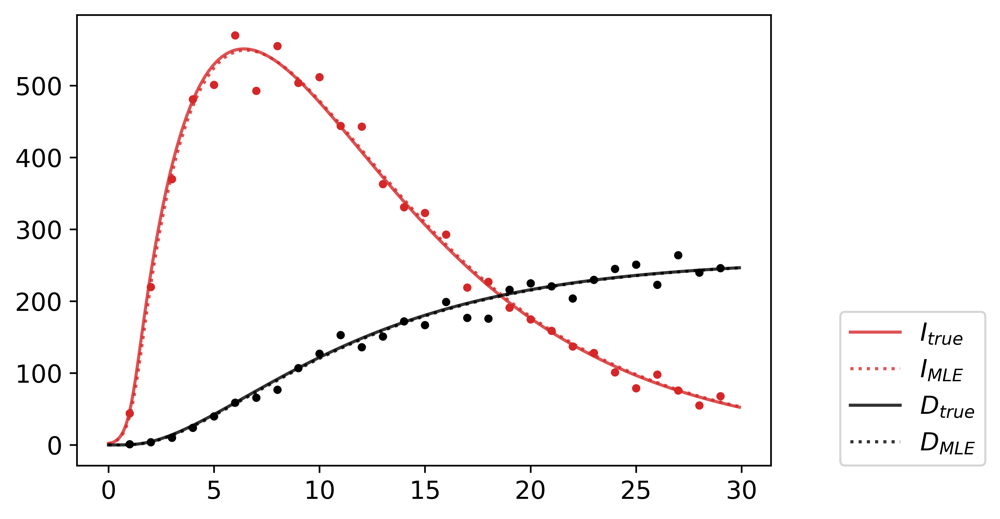

In [31]:
labels = ["I","D"]
col = ["tab:red", "black"]
for i in range(len(labels)):
    plt.plot(t_vec_smooth,y_ID_smooth[:,i],label = f"${labels[i]}_{{true}}$", c = col[i], alpha = 0.8)
    plt.plot(t_vec_smooth, y_ml_ID_smooth[:,i],":",label = f"${labels[i]}_{{MLE}}$", c = col[i], alpha = 0.8)
    plt.plot(t_vec[1:],obs_ID[:,i], ".", c = col[i])
plt.legend(loc= (1.1,0));

## MCMC

### Run MCMC or read MCMC results from file

In [32]:
import emcee
np.random.seed(42)

# Initialize the walkers
param_MLE = np.array([BETA_ml, GAMMA_ml])
theta_0 = param_MLE * np.random.uniform(low = 0.5, high = 2, size =(32, 2)) # scale MLE estimates by uniformly distributed factors between [0.5, 2]
nwalkers, ndim = theta_0.shape
step_autocorr = 100 # steps when to check for convergence

In [34]:
# Set up the backend
results_folder = "./"
filename = "LdV_simple-SEIRD_Poisson-calibration.h5"
backend = emcee.backends.HDFBackend(results_folder+filename)

try:
    # Read results if MCMC is already run before
    #-------------------------------------------
    sampler = backend
    sampler.get_autocorr_time()
except AttributeError:
    # Run MCMC
    #-------------------------------------------
    # Initialize the sampler
    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability, backend=backend, args = (t_vec, obs_ID))
    max_n = 10000

    # We'll track how the average autocorrelation time estimate changes
    index = 0
    autocorr = np.empty(max_n//100)

    # This will be useful for testing convergence
    old_tau = np.inf

    # Now we'll sample for up to max_n steps
    for sample in sampler.sample(theta_0, iterations=max_n, progress=True):
        # Only check convergence every `step_autocorr` steps
        if sampler.iteration % step_autocorr:
            continue

        # Compute the autocorrelation time so far
        # Using tol=0 means that we'll always get an estimate even
        # if it isn't trustworthy
        tau = sampler.get_autocorr_time(tol=0)
        autocorr[index] = np.mean(tau)
        index += 1

        # Check convergence
        converged = np.all(tau * step_autocorr < sampler.iteration) # condition 1: chain is longer than `step_autocorr` times the autocorrelation
        converged &= np.all(np.abs(old_tau - tau) / tau < 0.01) # condition 2 : autocorrelation estimate has converged
        if converged:
            break
        old_tau = tau

#### Inspect raw chains

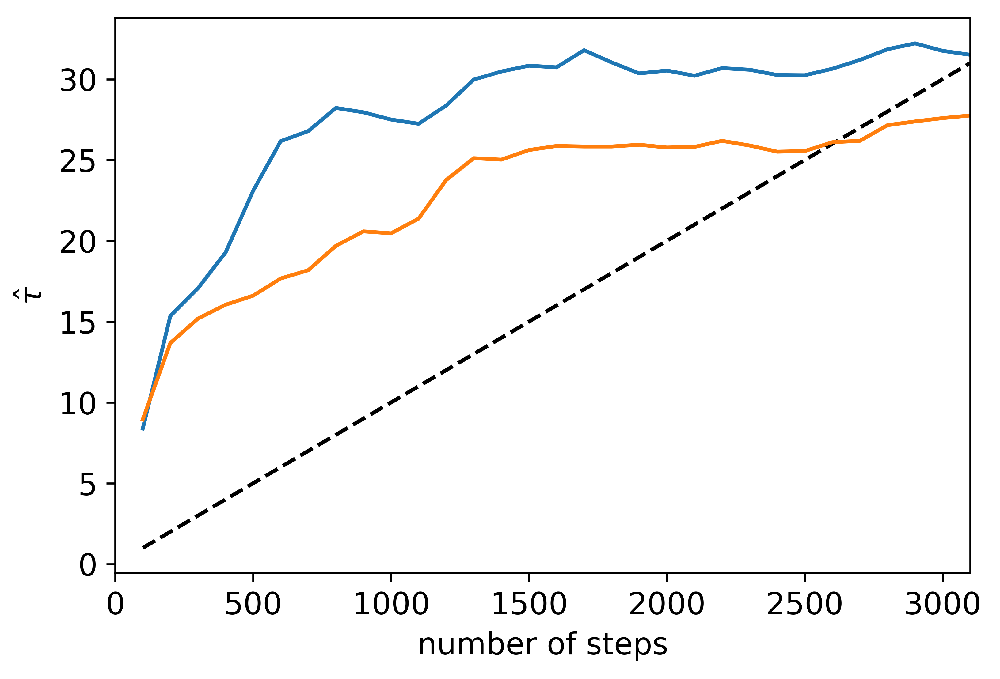

In [35]:
try: # MCMC has just been run
    tau_vect = autocorr[:index]
    ylabel = r"mean $\hat{\tau}$"
except NameError: # chains are read from file
    chains = sampler.get_chain()
    tau_vect = np.empty((len(chains)//100-1,ndim))
    index = 0
    for i in range(step_autocorr, len(chains), step_autocorr):
        tau_vect[index] = emcee.autocorr.integrated_time(chains[:i], tol = 0)
        index += 1
    ylabel = r"$\hat{\tau}$"
        
n = 100 * np.arange(1, index + 1)
plt.plot(n, n / 100.0, "--k")
plt.plot(n, tau_vect)
plt.xlim(0, n.max())
plt.xlabel("number of steps")
plt.ylabel(ylabel);

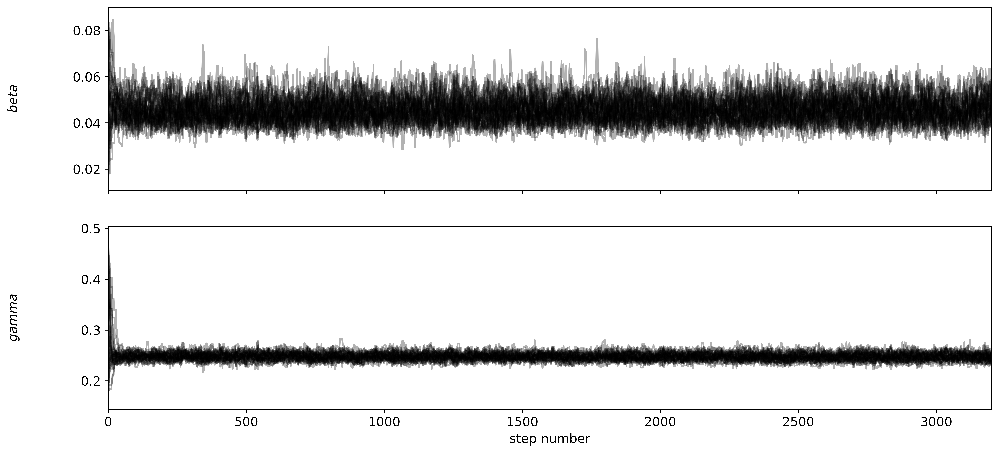

In [16]:
fig, axes = plt.subplots(2, figsize=(15, 7), sharex=True)
tau = sampler.get_autocorr_time()
samples_raw = sampler.get_chain()
labels = ["$beta$", "$gamma$"]
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples_raw[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples_raw))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

#### Warm-up (burn-in) and thinning

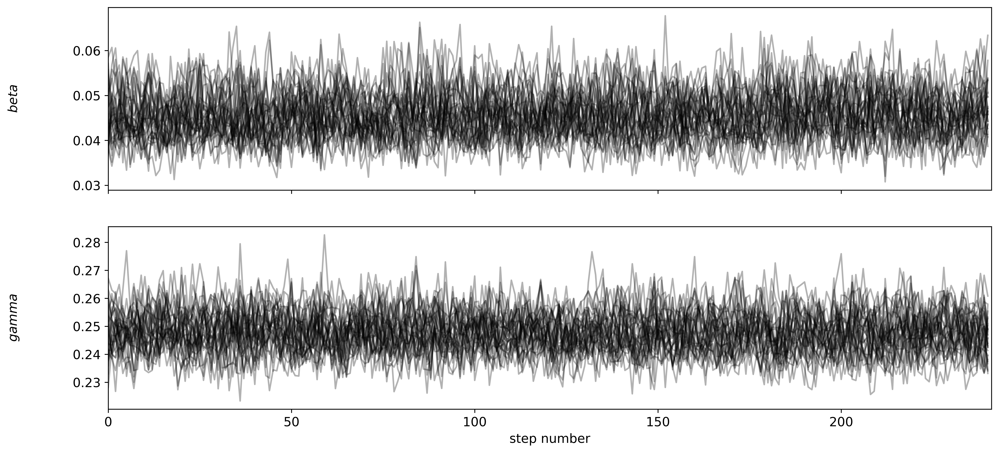

In [17]:
burnin = int(2 * np.max(tau)) 
thin = int(0.5 * np.min(tau))
fig, axes = plt.subplots(2, figsize=(15, 7), sharex=True)
samples_chains = sampler.get_chain(discard=burnin, thin=thin)
labels = ["$beta$", "$gamma$"]
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples_chains[:,:, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples_chains))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

#### plot 

burn-in: 63
thin: 13
flat chain shape: (7712, 2)


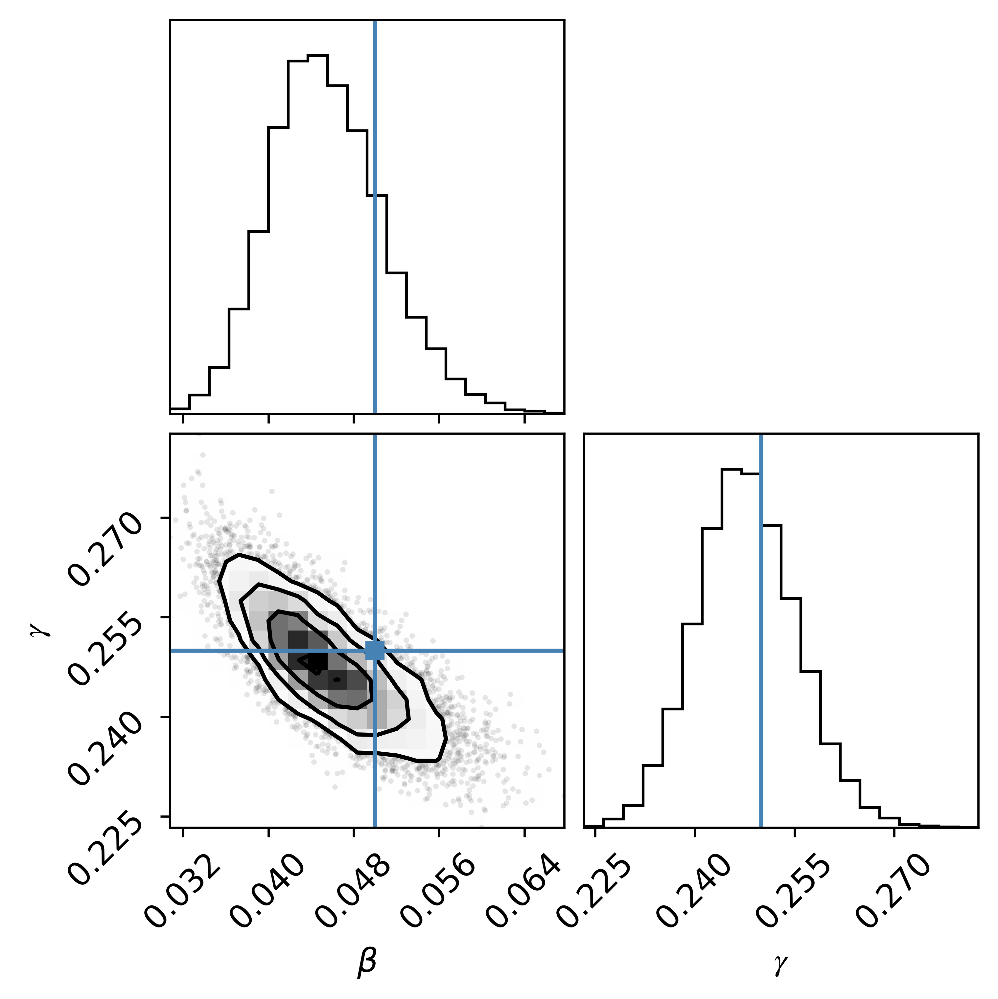

In [18]:
import corner

samples = sampler.get_chain(discard=burnin, flat=True, thin=thin)
log_prob_samples = sampler.get_log_prob(discard=burnin, flat=True, thin=thin)

print("burn-in: {0}".format(burnin))
print("thin: {0}".format(thin))
print("flat chain shape: {0}".format(samples.shape))

labels = ["$β$", "$𝛾$"]

corner.corner(samples, labels=labels, truths=true_params);

## Draw from posteriors

#### Ignoring error terms 
Only accounting for posterior uncertainty in beta and gamma.

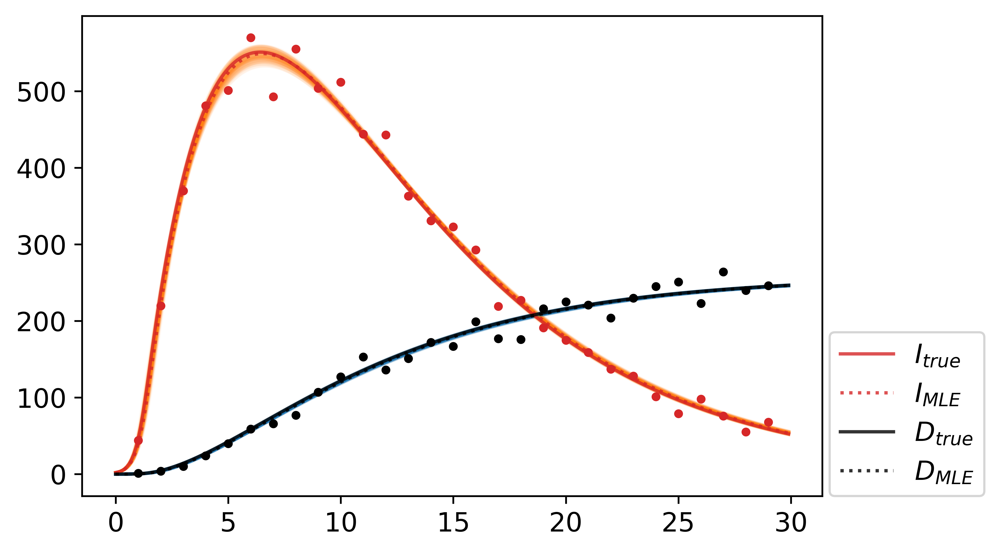

In [19]:
np.random.seed(42)
inds = np.random.randint(len(samples), size=100)
n_rep = 10
labels = ["I","D"]
col = ["tab:red", "black"]

for ind in inds:
    beta, gamma = samples[ind]
    params_post = np.array([beta, gamma ,0.10, 0.030])
    y_post_ID = odeint(dy_dt, y_0, t_vec_smooth, args=(params_post,))
    plt.plot(t_vec_smooth,y_post_ID[:,2], c = "tab:orange", alpha = 0.05)
    plt.plot(t_vec_smooth,y_post_ID[:,4], c = "tab:blue", alpha = 0.05)


for i in range(len(labels)):
    plt.plot(t_vec_smooth,y_ID_smooth[:,i],label = f"${labels[i]}_{{true}}$", c = col[i], alpha = 0.8)
    plt.plot(t_vec_smooth, y_ml_ID_smooth[:,i],":",label = f"${labels[i]}_{{MLE}}$", c = col[i], alpha = 0.8)
    plt.plot(t_vec[1:],obs_ID[:,i], ".", c = col[i])
    
plt.legend(loc= (1.01,0));

#### Accounting for all uncertainty
Draws from full posterior.

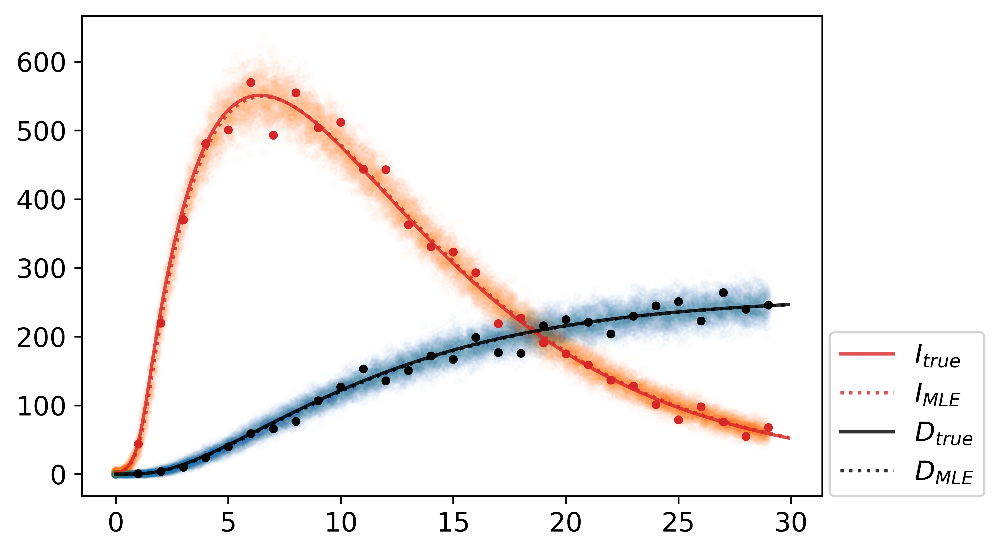

In [20]:
inds = np.random.randint(len(samples), size=500)
state_labels = ["I","D"]
col = ["tab:red", "black"]

for ind in inds:
    beta, gamma = samples[ind]
    params_post = np.array([beta, gamma ,0.10, 0.030])
    # add jitter to the t-vector
    t_vec_jitter = t_vec.copy()
    t_vec_jitter[1:] = t_vec[1:] - np.random.rand(len(t_vec)-1)
    y_post_ID = odeint(dy_dt, y_0, t_vec_jitter, args=(params_post,))
    plt.plot(t_vec_jitter, np.random.poisson(y_post_ID[:,2]),".", c= "tab:orange", alpha = 0.01)
    plt.plot(t_vec_jitter, np.random.poisson(y_post_ID[:,4]),".", c = "tab:blue", alpha = 0.01)


for i in range(len(labels)):
    plt.plot(t_vec_smooth,y_ID_smooth[:,i],label = f"${labels[i]}_{{true}}$", c = col[i], alpha = 0.8)
    plt.plot(t_vec_smooth, y_ml_ID_smooth[:,i],":",label = f"${labels[i]}_{{MLE}}$", c = col[i], alpha = 0.8)
    plt.plot(t_vec[1:],obs_ID[:,i], ".", c = col[i])
    
plt.legend(loc= (1.01,0));

## (approximated) credible intervals
Based on the draws from the posterior, we can set up approximate credible intervals.

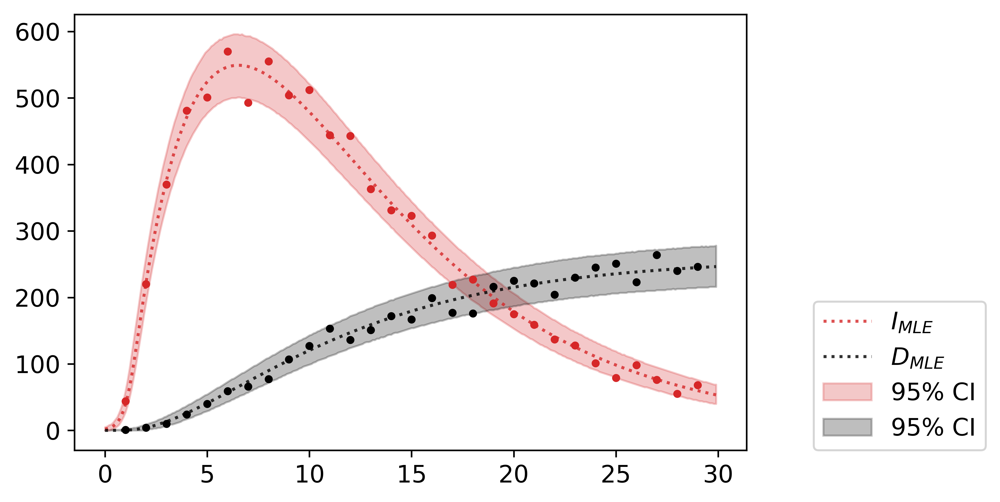

In [21]:
np.random.seed(42)
n_draws = 100 # draws from posterior 
n_draws_per_sample = 500 # draws from poisson per sample from posterior
n_t_steps = len(t_vec_smooth) # use a fine-grained t-vector to get smooth results
inds = np.random.randint(len(samples), size = n_draws) 


# initialise
posterior_draws_I = np.empty((n_t_steps, n_draws_per_sample * n_draws))
posterior_draws_D = np.empty_like(posterior_draws_I)

# draw en collect results
for i in range(n_draws):
    ind = inds[i]
    beta, gamma = samples[ind]
    params_post = np.array([beta, gamma ,0.10, 0.030])
    y_post = odeint(dy_dt, y_0, t_vec_smooth, args=(params_post,))
    posterior_draws_I[:,i*n_draws_per_sample:(i+1)*n_draws_per_sample] = np.random.poisson( y_post[:,2],size = (n_draws_per_sample,n_t_steps)).T #transpose is needed, because np.random.poisson is not so flexible with shape
    posterior_draws_D[:,i*n_draws_per_sample:(i+1)*n_draws_per_sample] = np.random.poisson( y_post[:,4],size = (n_draws_per_sample,n_t_steps)).T

# compute quantiles
I_025 = np.quantile(posterior_draws_I, q = 0.025, axis = 1)
I_975 = np.quantile(posterior_draws_I, q = 0.975, axis = 1)
D_025 = np.quantile(posterior_draws_D, q = 0.025, axis = 1)
D_975 = np.quantile(posterior_draws_D, q = 0.975, axis = 1)


# plot quantiles
plt.fill_between(t_vec_smooth, I_975, I_025, label = "95% CI", color = "tab:red", alpha = 0.25)
plt.fill_between(t_vec_smooth, D_975, D_025, label = "95% CI", color = "black", alpha = 0.25)

state_labels = ["I","D"]
col = ["tab:red", "black"]
for i in range(len(labels)):
    plt.plot(t_vec_smooth, y_ml_ID_smooth[:,i],":",label = f"${state_labels[i]}_{{MLE}}$", c = col[i], alpha = 0.8)
    plt.plot(t_vec[1:],obs_ID[:,i], ".", c = col[i])
plt.legend(loc= (1.1,0));